In [31]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable


from ipywidgets import interact, fixed
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from matplotlib.patches import Ellipse
from scipy import linalg

#import plotly.express as px
import urllib.request
import zipfile
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors
from matplotlib.ticker import FuncFormatter
from sklearn.decomposition import PCA, FactorAnalysis
from factor_analyzer import FactorAnalyzer, calculate_kmo, calculate_bartlett_sphericity
from sklearn.preprocessing import StandardScaler
from factor_analyzer import FactorAnalyzer

import os
# os.environ["OMP_NUM_THREADS"] = "2"

from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV

from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_regression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, mean_absolute_percentage_error, mean_squared_error
import geopandas as gpd

import warnings
warnings.filterwarnings("ignore", message="KMeans is known to have a memory leak")

# Your Gaussian Mixture Model code here


In [32]:
data_standardized = pd.read_csv('../../data/tidy/raw-data-standardized.csv') # modeshares (for commuting)
factors_df = pd.read_csv('../../data/tidy/raw-data-cleaned.csv')


factors_df
non_standarized = factors_df

In [33]:
data_standardized

,Node Count,Edge Count,Degree Average,Edge Length Total (km),Edge Length Average (km),Streets per Node Average,Intersection Count,Street Length Total (km),Street Segment Count,Street Length Average (km),...,Other Fuel (GGE),Electric Propulsion (kwh),Electric Battery (kwh),Diesel (miles),Gasoline (miles),Compressed Natural Gas (miles),Other Fuel (miles),Electric Propulsion (miles),Electric Battery (miles),Population Density (people/sq km)
0,-0.340119,-0.313531,1.394284,-0.089796,1.204496,1.187439,-0.308795,-0.105106,-0.314426,1.203868,...,-0.097156,-0.097615,-0.152178,-0.239195,-0.318118,-0.180041,-0.201659,-0.089999,-0.149891,-0.707731
1,-0.073031,-0.045155,0.627727,-0.180780,-0.989995,0.364867,-0.058596,-0.179483,-0.062155,-0.954158,...,-0.097156,-0.097615,-0.152178,-0.067667,-0.205368,0.195232,-0.201659,-0.089999,-0.149891,1.806119
2,-0.465912,-0.454650,1.053723,-0.440662,1.028113,0.896967,-0.442272,-0.435458,-0.447726,1.046351,...,-0.097156,-0.097615,-0.152178,-0.229501,-0.315604,-0.127940,-0.201659,-0.089999,-0.149891,-0.602396
3,-0.494398,-0.496671,-0.307877,-0.498871,1.468872,-0.881657,-0.492269,-0.499597,-0.490972,1.491942,...,-0.097156,-0.097615,-0.152178,-0.239195,-0.318118,-0.180041,-0.201659,-0.089999,-0.149891,-0.733188
4,0.142895,0.176087,0.485957,0.402801,-0.262060,0.357593,0.185299,0.367444,0.152308,-0.268342,...,-0.097156,-0.097615,-0.064929,0.326039,-0.047941,-0.180041,-0.201659,-0.089999,-0.149891,0.169205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,-0.413511,-0.402984,0.682944,-0.228503,1.739652,0.055046,-0.406768,-0.245774,-0.404294,1.779792,...,-0.097156,-0.097615,-0.152178,-0.191356,-0.262700,-0.180041,-0.201659,-0.089999,-0.149891,-0.722257
351,-0.291754,-0.270291,0.894350,-0.268256,-0.152058,0.525332,-0.265829,-0.280884,-0.276556,-0.166082,...,-0.097156,-0.097615,-0.152178,-0.205427,0.948860,-0.114442,-0.201659,-0.089999,-0.149891,0.836224
352,-0.115311,-0.081366,0.913208,0.028462,-0.178701,0.614765,-0.091407,0.017118,-0.097683,-0.133857,...,-0.097156,-0.097615,-0.152178,-0.143107,-0.220272,-0.180041,-0.201659,-0.089999,-0.149891,0.178285
353,-0.466916,-0.464644,0.148688,-0.515182,0.511774,-0.153088,-0.458354,-0.510606,-0.458418,0.508351,...,-0.097156,-0.097615,-0.152178,-0.178559,-0.318118,-0.180041,-0.201659,-0.089999,-0.149891,-0.432031


In [34]:
factors_df

,msa,Node count,Edge count,Degree average,Edge length total (km),Edge length average (km),Streets per node average,Intersection count,Street length total (km),Street segment count,...,Other Fuel (gal/gal equivalent),Electric Propulsion (kwh),Electric Battery (kwh),Diesel (miles),Gasoline (miles),Compressed Natural Gas (miles),Other Fuel (miles),Electric Propulsion (miles),Electric Battery (miles),Population density (people/sq km)
0,"Abilene, TX",14357.0,39401.0,5.488751,17168.965935,0.435749,2.881452,11912.0,8925.436120,20606.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.019917
1,"Akron, OH",26865.0,70900.0,5.278243,15191.985931,0.214273,2.756896,21200.0,8039.294972,36980.0,...,0.0,0.0,0.0,2619706.0,560570.0,3166425.0,0.0,0.0,0.0,294.018910
2,"Albany, GA",8466.0,22838.0,5.395228,9545.102272,0.417948,2.837468,6957.0,4989.592979,11954.0,...,0.0,0.0,0.0,148053.0,12499.0,439611.0,0.0,0.0,0.0,35.333378
3,"Albany-Lebanon, OR",7132.0,17906.0,5.021312,8280.294430,0.462431,2.568144,5101.0,4225.438910,9147.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.285743
4,"Albany-Schenectady-Troy, NY",36977.0,96867.0,5.239311,27872.441864,0.287739,2.755794,30254.0,14555.424691,50900.0,...,0.0,0.0,42126.0,8632669.0,1343264.0,0.0,0.0,0.0,0.0,118.206895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,"Yakima, WA",10920.0,28902.0,5.293407,14155.026874,0.489759,2.709982,8275.0,7249.500452,14773.0,...,0.0,0.0,0.0,730634.0,275527.0,0.0,0.0,0.0,0.0,22.459825
351,"York-Hanover, PA",16622.0,44476.0,5.351462,13291.255851,0.298841,2.781194,13507.0,6831.204674,23064.0,...,0.0,0.0,0.0,515734.0,6299147.0,553503.0,0.0,0.0,0.0,189.847748
352,"Youngstown-Warren-Boardman, OH-PA",24885.0,66650.0,5.356641,19738.540791,0.296152,2.794736,19982.0,10381.621775,34674.0,...,0.0,0.0,0.0,1467533.0,486469.0,0.0,0.0,0.0,0.0,119.182102
353,"Yuba City, CA",8419.0,21665.0,5.146692,7925.868395,0.365837,2.678465,6360.0,4094.273240,11260.0,...,0.0,0.0,0.0,926082.0,0.0,0.0,0.0,0.0,0.0,53.631459


In [35]:
# Define the number of factors to retain
n_factors = 7

# Perform Factor Analysis for each rotation and store factor scores
factor_scores = {}
rotations = ['varimax', 'oblimax', 'quartimax', 'equamax', 'geomin_ort', 'promax', 'oblimin', 'quartimin', 'geomin_obl', None]

for rotation in rotations:
    fa = FactorAnalyzer(n_factors=n_factors, rotation=rotation,method='ml')
    fa.fit(data_standardized)
    scores = fa.transform(data_standardized)
    factor_scores[rotation] = scores

# Choose the rotation method you prefer, here we use 'varimax' as an example
chosen_rotation = 'varimax'
scores = factor_scores[chosen_rotation]

# Standardize the factor scores if needed
# scaler_scores = StandardScaler()
# scores_standardized = scaler_scores.fit_transform(scores)
scaler = StandardScaler()
scores_standardized = scaler.fit_transform(scores)

# # Fit a Gaussian Mixture Model (GMM)
# n_components = 5  # Number of clusters to form
# gmm = GaussianMixture(n_components=n_components, random_state=42)
# gmm.fit(scores_standardized)
# cluster_labels = gmm.predict(scores_standardized)

# # Add the cluster labels to the original DataFrame
# factors_df['Cluster'] = cluster_labels

# # Visualize the clusters
# plt.figure(figsize=(12, 8))
# sns.scatterplot(x=scores_standardized[:, 0], y=scores_standardized[:, 6], hue=cluster_labels, palette='viridis')
# plt.title('Clusters based on Factor Scores')
# plt.xlabel('Factor 1')
# plt.ylabel('Factor 2')
# plt.show()

In [36]:
scores_df = pd.DataFrame(scores, columns=[f'Factor {i+1}' for i in range(7)])
scores_df

,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7
0,0.064028,-0.090245,-0.400060,-0.559346,-0.116166,1.189935,-0.933108
1,-0.644944,-0.092501,0.164063,2.346351,-0.385593,0.417458,0.117013
2,-0.260352,0.017480,0.051700,-0.639637,-0.544648,0.891404,-0.652800
3,-0.245210,0.049604,0.265477,-1.116083,-0.324938,-0.909080,-1.168184
4,0.192923,-0.144945,-0.251121,0.409409,0.719031,0.376100,0.017240
...,...,...,...,...,...,...,...
350,0.028180,0.015642,0.263209,-1.323508,-0.913108,0.023896,-1.262105
351,-0.667277,-0.056662,0.188996,1.740468,-0.612997,0.558831,-0.484439
352,-0.138366,-0.086734,-0.145649,0.828986,-0.601778,0.650931,-0.057509
353,-0.413179,0.043812,0.134645,-0.453808,-0.491657,-0.147507,-0.227548


In [37]:
def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    return estimator.aic(X) 


param_grid = {
    "n_components": range(2, 8),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(random_state=222), param_grid=param_grid, scoring=gmm_bic_score
)

grid_search.fit(scores) #Z_tsne

df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df["mean_test_score"] = df["mean_test_score"]
df = df.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)
df.sort_values(by="BIC score")#.head()

,Number of components,Type of covariance,BIC score
13,3,diag,1148.226398
19,3,full,1153.920186
15,5,diag,1179.157695
17,7,diag,1200.578756
16,6,diag,1214.894247
20,4,full,1277.542170
1,3,spherical,1283.365678
0,2,spherical,1283.675643
2,4,spherical,1297.288673
5,7,spherical,1309.349450


In [38]:
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV
import pandas as pd

# Define the parameter grid
param_grid = {
    "n_components": range(2, 11),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}

# Create the GridSearchCV object without the custom scoring function
grid_search = GridSearchCV(
    GaussianMixture(random_state=222), param_grid=param_grid
)

# Fit the GridSearchCV object to the data
grid_search.fit(scores)  # Z_tsne

# Extract and format the results
df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df = df.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "Log-likelihood score",
    }
)
df = df.sort_values(by="Log-likelihood score", ascending=False)  # Higher log-likelihood is better

df


,Number of components,Type of covariance,Log-likelihood score
32,7,full,-6.381076
28,3,full,-6.619156
26,10,diag,-6.750942
30,5,full,-6.760344
31,6,full,-6.774501
33,8,full,-6.862795
25,9,diag,-6.936708
29,4,full,-6.982691
23,7,diag,-6.989991
24,8,diag,-7.089754


In [39]:
gmm_grid = df.copy()
gmm_grid['Type of covariance'] = gmm_grid['Type of covariance'].map({"spherical":"Spherical", "tied":"Tied", "diag":"Diagonal", "full":"Full"})

    Number of components Type of covariance  Log-likelihood score
32                     7               Full             -6.381076
28                     3               Full             -6.619156
26                    10           Diagonal             -6.750942
30                     5               Full             -6.760344
31                     6               Full             -6.774501
33                     8               Full             -6.862795
25                     9           Diagonal             -6.936708
29                     4               Full             -6.982691
23                     7           Diagonal             -6.989991
24                     8           Diagonal             -7.089754
21                     5           Diagonal             -7.261674
22                     6           Diagonal             -7.302072
34                     9               Full             -7.332630
19                     3           Diagonal             -7.466383
35        

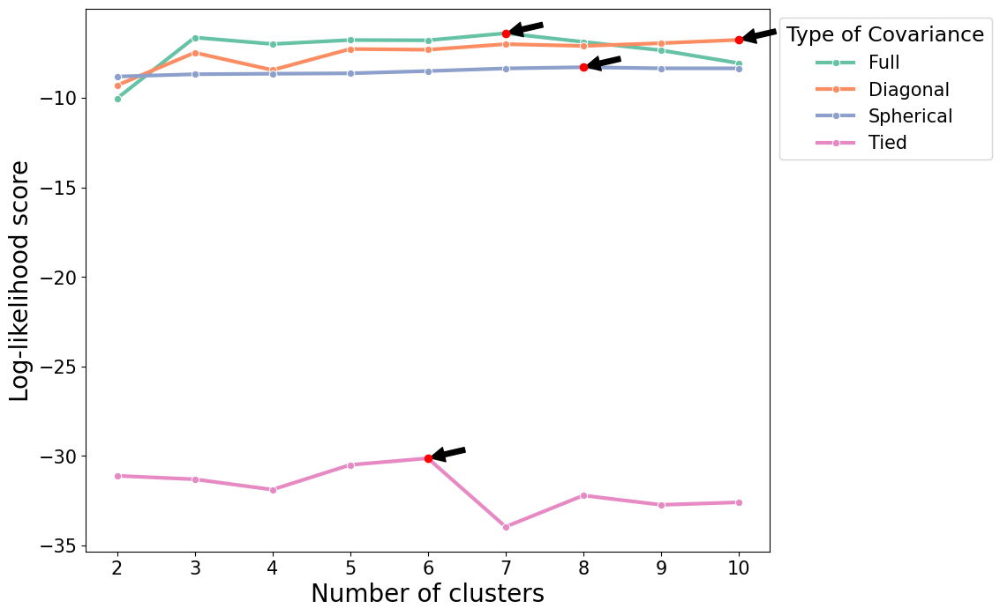

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming gmm_grid is your DataFrame
print(gmm_grid)

plt.figure(figsize=(10, 8))  # Increase figure size to accommodate the legend

# Plot the lineplot with increased line thickness
g = sns.lineplot(data=gmm_grid, x='Number of components', y='Log-likelihood score', hue='Type of covariance',
                 palette='Set2', marker='o', linewidth=3)

plt.xlabel("Number of clusters", fontsize=20)
plt.ylabel("Log-likelihood score", fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# Move the legend outside and add a title to the legend
plt.legend(title='Type of Covariance', fontsize=15, title_fontsize=17, loc='upper left', bbox_to_anchor=(1, 1))

# Find the optimal point (maximum Log-likelihood score) for each type of covariance
optimal_points = gmm_grid.loc[gmm_grid.groupby('Type of covariance')['Log-likelihood score'].idxmax()]

# Annotate each optimal point
for _, point in optimal_points.iterrows():
    x = point['Number of components']
    y = point['Log-likelihood score']
    plt.annotate('', xy=(x, y), xytext=(x + 0.5, y + 0.5),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=15, color='black')
    plt.scatter(x, y, color='red', zorder=5)  # Highlight the point with a red dot

# Use bbox_inches='tight' to ensure the legend is included
plt.savefig('../../figures/log-likelihood.jpg', dpi=600, bbox_inches='tight')
plt.show() 


    Number of components Type of covariance  Log-likelihood score
32                     7               Full             -6.381076
28                     3               Full             -6.619156
26                    10           Diagonal             -6.750942
30                     5               Full             -6.760344
31                     6               Full             -6.774501
33                     8               Full             -6.862795
25                     9           Diagonal             -6.936708
29                     4               Full             -6.982691
23                     7           Diagonal             -6.989991
24                     8           Diagonal             -7.089754
21                     5           Diagonal             -7.261674
22                     6           Diagonal             -7.302072
34                     9               Full             -7.332630
19                     3           Diagonal             -7.466383
35        

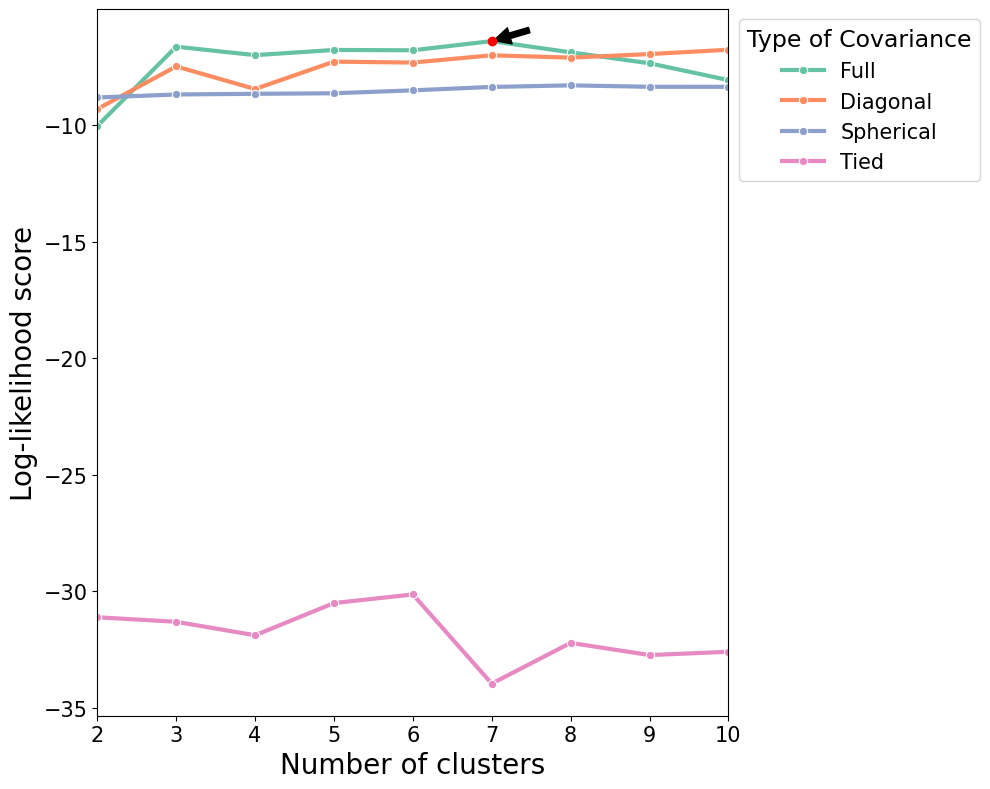

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming gmm_grid is your DataFrame
print(gmm_grid)

plt.figure(figsize=(10, 8))  # Increase figure size to accommodate the legend

# Plot the lineplot with increased line thickness
g = sns.lineplot(data=gmm_grid, x='Number of components', y='Log-likelihood score', hue='Type of covariance',
                 palette='Set2', marker='o', linewidth=3)

plt.xlabel("Number of clusters", fontsize=20)
plt.ylabel("Log-likelihood score", fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# Set the x-axis limits to 2-10
plt.xlim(2, 10)

# Move the legend outside and add a title to the legend
plt.legend(title='Type of Covariance', fontsize=15, title_fontsize=17, loc='upper left', bbox_to_anchor=(1, 1))

# Adjust the margins to remove the white space
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.1)

# Find the optimal point (maximum Log-likelihood score) for the "full" covariance type
optimal_point_full = gmm_grid[gmm_grid['Type of covariance'] == 'Full'].loc[gmm_grid[gmm_grid['Type of covariance'] == 'Full']['Log-likelihood score'].idxmax()]

# Annotate the optimal point
x = optimal_point_full['Number of components']
y = optimal_point_full['Log-likelihood score']
plt.annotate('', xy=(x, y), xytext=(x + 0.5, y + 0.5),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=15, color='black')
plt.scatter(x, y, color='red', zorder=5)  # Highlight the point with a red dot

# Use tight layout to reduce white space
plt.tight_layout()

# Save the figure with bbox_inches='tight' to include the legend
plt.savefig('../../figures/log-likelihood.jpg', dpi=600, bbox_inches='tight')
plt.show()


In [42]:
gmm_grid[gmm_grid['Type of covariance'] == 'full']

,Number of components,Type of covariance,Log-likelihood score


In [43]:
gmm = GaussianMixture(random_state=222, n_components=7,covariance_type="full")
gmm.fit(scores)

GaussianMixture(n_components=7, random_state=222)

In [44]:
YY = gmm.predict(scores)

In [45]:
pcdf = pd.DataFrame(scores, columns = ['Size--Auto','Public Transportation','Transit Alternative Fuel','Density','Active Mobility','Network Connectivity','Network Compactness'])

In [46]:

new_column = factors_df['msa']
pcdf.insert(0, 'msa', new_column)

In [47]:
pcdf
pcdf.to_csv('../../data/tidy/factors-factoranalysis.csv', index=False)
pcdf

,msa,Size--Auto,Public Transportation,Transit Alternative Fuel,Density,Active Mobility,Network Connectivity,Network Compactness
0,"Abilene, TX",0.064028,-0.090245,-0.400060,-0.559346,-0.116166,1.189935,-0.933108
1,"Akron, OH",-0.644944,-0.092501,0.164063,2.346351,-0.385593,0.417458,0.117013
2,"Albany, GA",-0.260352,0.017480,0.051700,-0.639637,-0.544648,0.891404,-0.652800
3,"Albany-Lebanon, OR",-0.245210,0.049604,0.265477,-1.116083,-0.324938,-0.909080,-1.168184
4,"Albany-Schenectady-Troy, NY",0.192923,-0.144945,-0.251121,0.409409,0.719031,0.376100,0.017240
...,...,...,...,...,...,...,...,...
350,"Yakima, WA",0.028180,0.015642,0.263209,-1.323508,-0.913108,0.023896,-1.262105
351,"York-Hanover, PA",-0.667277,-0.056662,0.188996,1.740468,-0.612997,0.558831,-0.484439
352,"Youngstown-Warren-Boardman, OH-PA",-0.138366,-0.086734,-0.145649,0.828986,-0.601778,0.650931,-0.057509
353,"Yuba City, CA",-0.413179,0.043812,0.134645,-0.453808,-0.491657,-0.147507,-0.227548


In [48]:
pcdf['Cluster'] =YY+1

In [49]:
pcdf.to_csv('../../data/tidy/factors-factoranalysis.csv', index=False)
pcdf

,msa,Size--Auto,Public Transportation,Transit Alternative Fuel,Density,Active Mobility,Network Connectivity,Network Compactness,Cluster
0,"Abilene, TX",0.064028,-0.090245,-0.400060,-0.559346,-0.116166,1.189935,-0.933108,4
1,"Akron, OH",-0.644944,-0.092501,0.164063,2.346351,-0.385593,0.417458,0.117013,5
2,"Albany, GA",-0.260352,0.017480,0.051700,-0.639637,-0.544648,0.891404,-0.652800,4
3,"Albany-Lebanon, OR",-0.245210,0.049604,0.265477,-1.116083,-0.324938,-0.909080,-1.168184,4
4,"Albany-Schenectady-Troy, NY",0.192923,-0.144945,-0.251121,0.409409,0.719031,0.376100,0.017240,5
...,...,...,...,...,...,...,...,...,...
350,"Yakima, WA",0.028180,0.015642,0.263209,-1.323508,-0.913108,0.023896,-1.262105,1
351,"York-Hanover, PA",-0.667277,-0.056662,0.188996,1.740468,-0.612997,0.558831,-0.484439,1
352,"Youngstown-Warren-Boardman, OH-PA",-0.138366,-0.086734,-0.145649,0.828986,-0.601778,0.650931,-0.057509,5
353,"Yuba City, CA",-0.413179,0.043812,0.134645,-0.453808,-0.491657,-0.147507,-0.227548,4


In [50]:
factors_df['Cluster'] =YY+1
factors_df
factors_df.to_csv('../../data/tidy/raw-data-cluster.csv', index=False)

In [51]:
pcdf_melt = pd.melt(pcdf.iloc[:, 1:], id_vars='Cluster', value_name='Factor Score',var_name='factors')

In [52]:
pcdf_melt

,Cluster,factors,Factor Score
0,4,Size--Auto,0.064028
1,5,Size--Auto,-0.644944
2,4,Size--Auto,-0.260352
3,4,Size--Auto,-0.245210
4,5,Size--Auto,0.192923
...,...,...,...
2480,1,Network Compactness,-1.262105
2481,1,Network Compactness,-0.484439
2482,5,Network Compactness,-0.057509
2483,4,Network Compactness,-0.227548


In [1]:
# Define the custom color palette
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']
color_iter = ListedColormap(custom_palette)

# Unique factors
unique_factors = pcdf_melt['factors'].unique()

# Create separate box plots for each factor
for factor in unique_factors:
    # Create a new figure and axis for each factor
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Create the box plot
    sns.boxplot(data=pcdf_melt[pcdf_melt['factors'] == factor], 
                x='factors', 
                hue='Cluster', 
                y='Factor Score', 
                palette=custom_palette, 
                saturation=1, 
                ax=ax)
    
    # Set alpha for boxplot collections
    plt.setp(ax.collections, alpha=.5)
    
    # Set axis labels and title
    ax.set_xlabel('', fontsize=30)  # Set x-axis label font size
    ax.set_ylabel('Factor Score', fontsize=30)  # Set y-axis label font size
    ax.set_title(f'{factor}', fontsize=30)  # Set title font size
    ax.set_xticklabels([])  # Remove x-axis labels
    
    # Customize tick parameters
    ax.tick_params(axis='both', which='major', labelsize=20)  # Change tick label size
    ax.tick_params(axis='both', which='minor', labelsize=15)   # Optional: change minor tick label size
    
    # Remove the legend
    ax.legend_.remove()
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the plot with the factor name in the file name
    #plt.savefig(f'../../figures/{factor}-boxplot.jpg', dpi=600)
    
    # Show the plot (optional, can be commented out if not needed)
    plt.show()

NameError: name 'ListedColormap' is not defined

C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: F

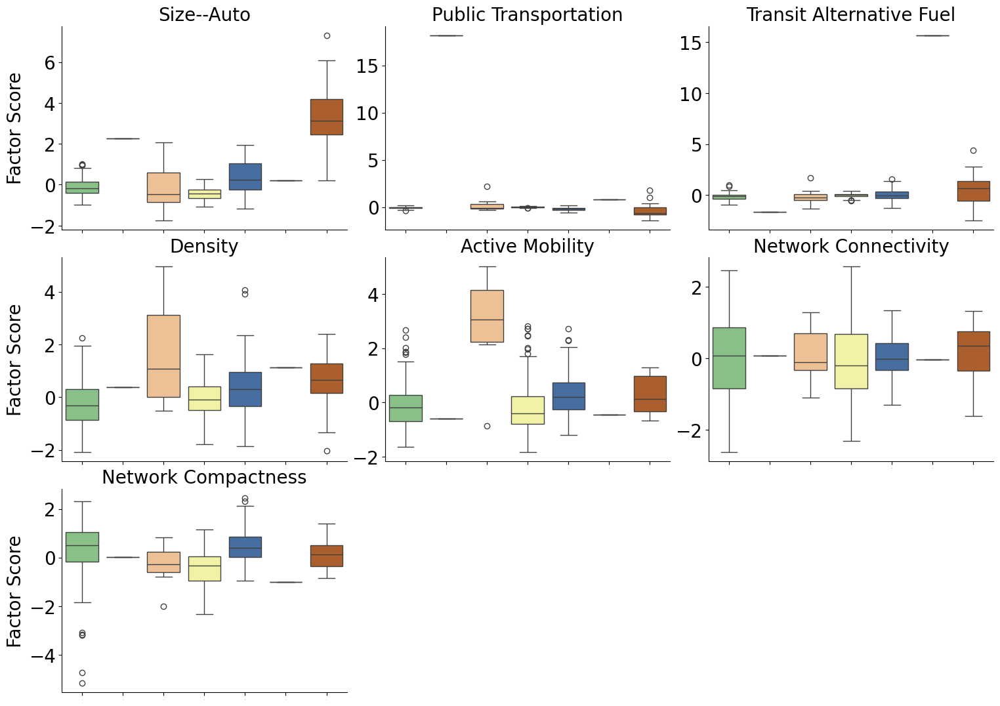

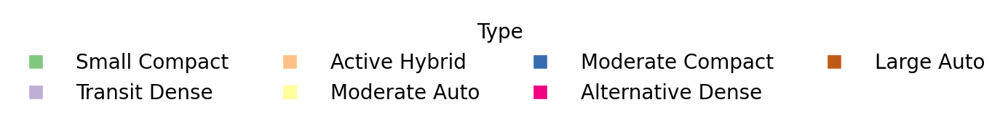

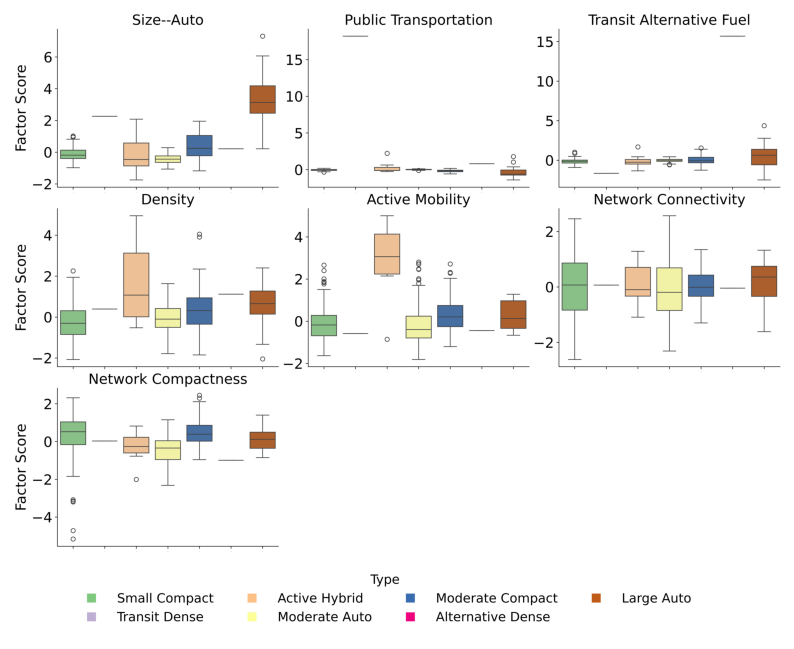

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D
import numpy as np

# Define the custom color palette
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']

# Create a mapping for cluster names
cluster_mapping = {
    1: 'Small Compact',
    2: 'Transit Dense',
    3: 'Active Hybrid',
    4: 'Moderate Auto',
    5: 'Moderate Compact',
    6: 'Alternative Dense',
    7: 'Large Auto'
}

# Create FacetGrid with a 3x3 layout
g = sns.FacetGrid(pcdf_melt, col='factors', col_wrap=3, height=5, sharex=False, sharey=False)

# Create box plots within each facet
g.map_dataframe(sns.boxplot, x='Cluster', y='Factor Score', palette=custom_palette)

# Set titles and labels
g.set_titles(col_template='{col_name}', size=20)
g.set_axis_labels('', 'Factor Score', size=20)

# Hide x-tick labels and show y-tick labels
for ax in g.axes.flat:
    ax.tick_params(axis='x', labelsize=0)  # Hide x-tick labels
    ax.tick_params(axis='y', labelsize=20)  # Show y-tick labels with specified size

# Create a dummy plot to generate the legend
fig_legend, ax_legend = plt.subplots(figsize=(10, 2))

# Create dummy lines for each cluster to generate the legend
handles = [Line2D([0], [0], marker='s', color='w', label=cluster_mapping[i], 
                  markersize=15, markerfacecolor=custom_palette[i-1], linestyle='') 
           for i in range(1, 8)]

# Add the legend to the plot
ax_legend.legend(handles=handles, bbox_to_anchor=(0.5, 0.5), loc='center', ncol=4, title="Type", title_fontsize='20', fontsize='20', handletextpad=1, frameon=False)

# Remove any plot elements from the legend plot
ax_legend.axis('off')

# Save the legend-only plot
legend_path = 'legend-only-clusters.jpg'
fig_legend.savefig(legend_path, dpi=600, bbox_inches='tight')

# Load the legend image
from matplotlib.image import imread
legend_img = imread(legend_path)

# Adjust FacetGrid layout and add space for the legend
g.fig.subplots_adjust(bottom=0.3)  # Adjust space below the grid to fit the legend

# Save the FacetGrid plot
facet_grid_path = '../../figures/factor-scores-boxplot.jpg'
g.savefig(facet_grid_path, dpi=600, bbox_inches='tight')

# Create a final figure to include both the FacetGrid plot and the legend
fig, ax = plt.subplots(figsize=(10, 8))

# Load the FacetGrid plot
facet_grid_img = imread(facet_grid_path)
ax.imshow(facet_grid_img)
ax.axis('off')

# Add the legend image below the facet plot
legend_ax = fig.add_axes([0.1, 0.05, 0.8, 0.1])  # [x, y, width, height]
legend_ax.imshow(legend_img)
legend_ax.axis('off')

# Save the final figure with the legend below
final_path = '../../figures/factor-scores-boxplot-with-legend.jpg'
plt.savefig(final_path, dpi=600, bbox_inches='tight')
plt.show()


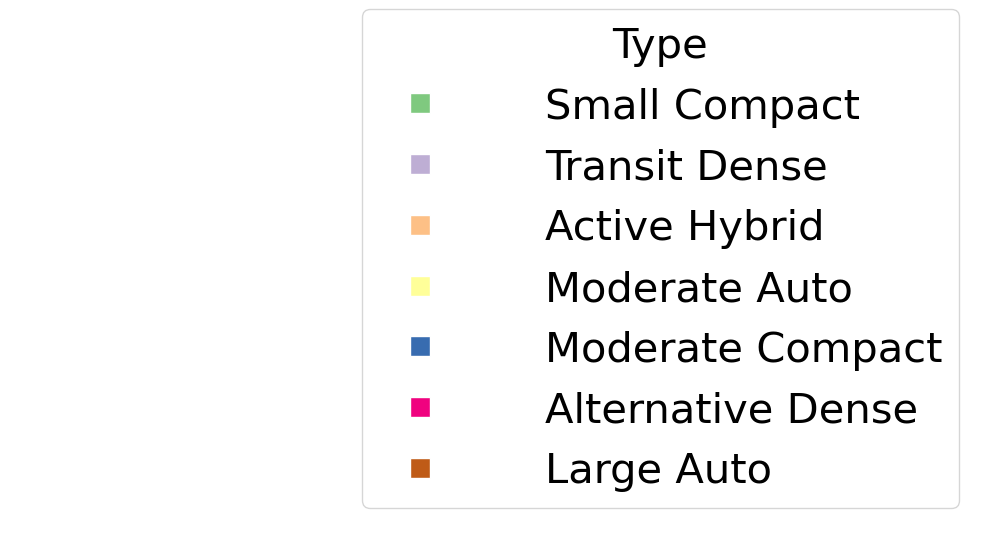

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

# Define the custom color palette
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']

# Create a mapping for cluster names
cluster_mapping = {
    1: 'Small Compact',
    2: 'Transit Dense',
    3: 'Active Hybrid',
    4: 'Moderate Auto',
    5: 'Moderate Compact',
    6: 'Alternative Dense',
    7: 'Large Auto'
}

# Create a dummy plot to only display the legend
fig, ax = plt.subplots(figsize=(10, 6))

# Create dummy lines for each cluster to generate the legend
handles = [Line2D([0], [0], marker='s', color='w', label=cluster_mapping[i], 
                  markersize=15, markerfacecolor=custom_palette[i-1], linestyle='') 
           for i in range(1, 8)]

# Add the legend to the plot
ax.legend(handles=handles, bbox_to_anchor=(1, 1.5), title="Type", title_fontsize='30', loc='best', fontsize='30', handletextpad=2)

# Remove any plot elements
ax.axis('off')

# Adjust layout
plt.tight_layout()

# Save the legend-only plot
plt.savefig('../../figures/legend-only-clusters.jpg', dpi=600)



In [57]:
#mapping and visualization
# Replace 'your_shapefile_path' with the path to your shapefile
gdf = gpd.read_file('../../data/raw/cb_2018_us_cbsa_500k/cb_2018_us_cbsa_500k.shp')
us_state = gpd.read_file('../../data/raw/cb_2018_us_state_500k/cb_2018_us_state_500k.shp')
# Filter for Metropolitan Statistical Areas (MSA)
msa_gdf = gdf[(gdf['CBSAFP'].notnull()) & (gdf['LSAD'] == 'M1')]

# Extract city and state from NAME in df2
msa_gdf[['Area', 'State']] = msa_gdf['NAME'].str.split(', ', expand=True)
msa_gdf['Area'] = msa_gdf['Area'].str.split('-').str[0]
msa_gdf

C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,CSAFP,CBSAFP,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,Area,State
0,None,31340,310M400US31340,31340,"Lynchburg, VA",M1,5491925729,68559452,"POLYGON ((-79.85840 37.26715, -79.85660 37.268...",Lynchburg,VA
1,488,42220,310M400US42220,42220,"Santa Rosa, CA",M1,4081491107,497455304,"POLYGON ((-123.53354 38.76841, -123.52851 38.7...",Santa Rosa,CA
3,538,46140,310M400US46140,46140,"Tulsa, OK",M1,16238554204,492994165,"POLYGON ((-97.06448 36.68106, -97.06411 36.684...",Tulsa,OK
5,None,41740,310M400US41740,41740,"San Diego-Carlsbad, CA",M1,10900649391,820695499,"POLYGON ((-117.59615 33.38717, -117.59360 33.3...",San Diego,CA
8,340,38220,310M400US38220,38220,"Pine Bluff, AR",M1,5255934204,143446207,"POLYGON ((-92.47391 34.00623, -92.47241 34.038...",Pine Bluff,AR
...,...,...,...,...,...,...,...,...,...,...,...
934,None,42020,310M400US42020,42020,"San Luis Obispo-Paso Robles-Arroyo Grande, CA",M1,8548611925,815519172,"POLYGON ((-121.34636 35.79518, -121.24378 35.7...",San Luis Obispo,CA
936,None,49740,310M400US49740,49740,"Yuma, AZ",M1,14281127830,13326079,"POLYGON ((-114.81629 32.50804, -114.81432 32.5...",Yuma,AZ
938,222,20020,310M400US20020,20020,"Dothan, AL",M1,4444678880,33248036,"POLYGON ((-86.19348 31.19221, -86.14167 31.192...",Dothan,AL
939,408,14860,310M400US14860,14860,"Bridgeport-Stamford-Norwalk, CT",M1,1618651428,549293518,"MULTIPOLYGON (((-73.21717 41.14391, -73.21611 ...",Bridgeport,CT


In [58]:
factors_df['Cluster'] = YY+1
factors_df

,msa,Node count,Edge count,Degree average,Edge length total (km),Edge length average (km),Streets per node average,Intersection count,Street length total (km),Street segment count,...,Electric Propulsion (kwh),Electric Battery (kwh),Diesel (miles),Gasoline (miles),Compressed Natural Gas (miles),Other Fuel (miles),Electric Propulsion (miles),Electric Battery (miles),Population density (people/sq km),Cluster
0,"Abilene, TX",14357.0,39401.0,5.488751,17168.965935,0.435749,2.881452,11912.0,8925.436120,20606.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.019917,4
1,"Akron, OH",26865.0,70900.0,5.278243,15191.985931,0.214273,2.756896,21200.0,8039.294972,36980.0,...,0.0,0.0,2619706.0,560570.0,3166425.0,0.0,0.0,0.0,294.018910,5
2,"Albany, GA",8466.0,22838.0,5.395228,9545.102272,0.417948,2.837468,6957.0,4989.592979,11954.0,...,0.0,0.0,148053.0,12499.0,439611.0,0.0,0.0,0.0,35.333378,4
3,"Albany-Lebanon, OR",7132.0,17906.0,5.021312,8280.294430,0.462431,2.568144,5101.0,4225.438910,9147.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.285743,4
4,"Albany-Schenectady-Troy, NY",36977.0,96867.0,5.239311,27872.441864,0.287739,2.755794,30254.0,14555.424691,50900.0,...,0.0,42126.0,8632669.0,1343264.0,0.0,0.0,0.0,0.0,118.206895,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,"Yakima, WA",10920.0,28902.0,5.293407,14155.026874,0.489759,2.709982,8275.0,7249.500452,14773.0,...,0.0,0.0,730634.0,275527.0,0.0,0.0,0.0,0.0,22.459825,1
351,"York-Hanover, PA",16622.0,44476.0,5.351462,13291.255851,0.298841,2.781194,13507.0,6831.204674,23064.0,...,0.0,0.0,515734.0,6299147.0,553503.0,0.0,0.0,0.0,189.847748,1
352,"Youngstown-Warren-Boardman, OH-PA",24885.0,66650.0,5.356641,19738.540791,0.296152,2.794736,19982.0,10381.621775,34674.0,...,0.0,0.0,1467533.0,486469.0,0.0,0.0,0.0,0.0,119.182102,5
353,"Yuba City, CA",8419.0,21665.0,5.146692,7925.868395,0.365837,2.678465,6360.0,4094.273240,11260.0,...,0.0,0.0,926082.0,0.0,0.0,0.0,0.0,0.0,53.631459,4


In [66]:
# If the column name is 'msa' instead of 'msas'
new_york_gdp = factors_df[factors_df['msa'] == 'New York-Newark-Jersey City, NY-NJ-PA']['Building area (sq km)']

In [67]:
new_york_gdp

227    543.950915
Name: Building area (sq km), dtype: float64

C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\peiyaozhao\AppData\Local\anaconda3\Lib\site-packages\seaborn\axisgrid.py:854: F

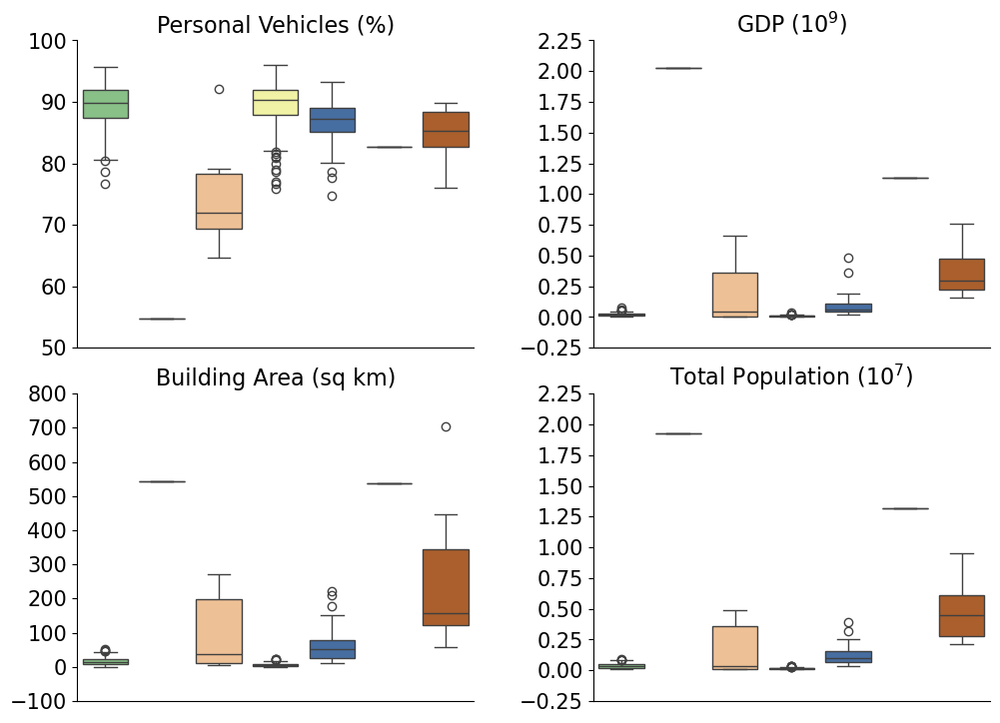

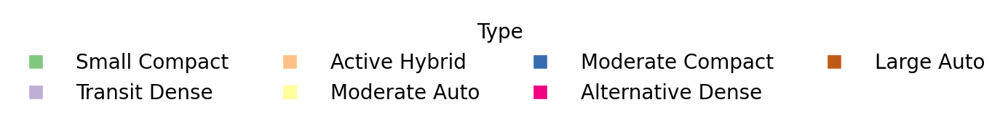

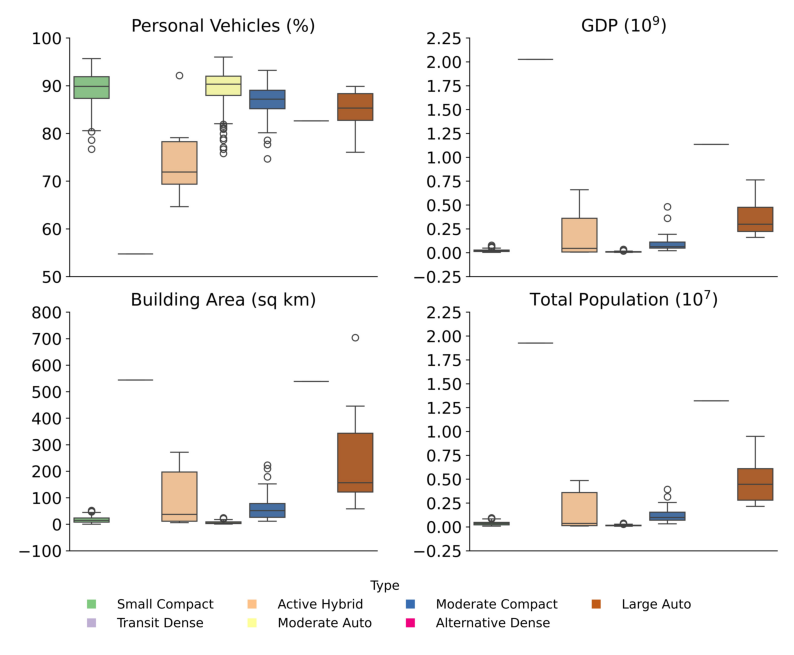

In [69]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Rename specific columns
factors_df = factors_df.rename(columns={
    'Car, truck, or van:': 'Personal Vehicles (%)',
    'Public transportation (excluding taxicab):': 'Public Transportation',
    'Median Income': 'Median Income',
    'Population density (people/sq km)': 'Population Density',
    'Total housing units': 'Total Housing Units',
    'GDP': 'GDP ($10^9$)',
    'Building area (sq km)': 'Building Area (sq km)',
    'Total population': 'Total Population ($10^7$)'
})

# Define the color palette
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']

# List of columns to plot
columns_to_plot = [
    'Personal Vehicles (%)', 'GDP ($10^9$)', 'Building Area (sq km)', 'Total Population ($10^7$)'
]

# Create a mapping for cluster names
cluster_mapping = {
    1: 'Small Compact',
    2: 'Transit Dense',
    3: 'Active Hybrid',
    4: 'Moderate Auto',
    5: 'Moderate Compact',
    6: 'Alternative Dense',
    7: 'Large Auto'
}
# Convert the DataFrame to a long format for FacetGrid
melted_df = factors_df.melt(id_vars=['Cluster'], value_vars=columns_to_plot, var_name='variable', value_name='value')

# Create a FacetGrid for the boxplots
n_cols = 2  # Number of columns in the facet grid
n_rows = len(columns_to_plot) // n_cols + (len(columns_to_plot) % n_cols != 0)  # Number of rows

g = sns.FacetGrid(melted_df, col='variable', col_wrap=n_cols, height=5, sharex=False, sharey=False)

# Map the boxplot to each facet
g.map_dataframe(sns.boxplot, x='Cluster', y='value', palette=custom_palette)

# Set titles and labels
g.set_titles(col_template='{col_name}', size=16)
g.set_axis_labels('', '', size=14)
g.set_yticklabels(size=15)

# Remove x-axis ticks and labels
for ax in g.axes.flat:
    ax.set_xticks([])  # Remove x-axis ticks
    ax.set_xticklabels([])  # Remove x-axis labels

# Adjust the spacing between plots
g.fig.subplots_adjust(wspace=0.3)  # Increase horizontal space

# Create a dummy plot to generate the legend
fig_legend, ax_legend = plt.subplots(figsize=(10, 2))

# Create dummy lines for each cluster to generate the legend
handles = [Line2D([0], [0], marker='s', color='w', label=cluster_mapping[i], 
                  markersize=15, markerfacecolor=custom_palette[i-1], linestyle='') 
           for i in range(1, 8)]

# Add the legend to the plot
ax_legend.legend(handles=handles, bbox_to_anchor=(0.5, 0.5), loc='center', ncol=4, title="Type", title_fontsize='20', fontsize='20', handletextpad=1, frameon=False)

# Remove any plot elements from the legend plot
ax_legend.axis('off')

# Save the legend-only plot
legend_path = '../../figures/legend-only-clusters.jpg'
fig_legend.savefig(legend_path, dpi=600, bbox_inches='tight')

# Adjust FacetGrid layout and add space for the legend
g.fig.subplots_adjust(bottom=0.3)  # Adjust space below the grid to fit the legend

# Save the FacetGrid plot
facet_grid_path = '../../figures/facet_boxplots.jpg'
g.savefig(facet_grid_path, dpi=600, bbox_inches='tight')

# Create a final figure to include both the FacetGrid plot and the legend
fig, ax = plt.subplots(figsize=(10, 8))

# Load the FacetGrid plot
facet_grid_img = imread(facet_grid_path)
ax.imshow(facet_grid_img)
ax.axis('off')

# Add the legend image below the facet plot
legend_img = imread(legend_path)
legend_ax = fig.add_axes([0.1, 0.05, 0.8, 0.1])  # [x, y, width, height]
legend_ax.imshow(legend_img)
legend_ax.axis('off')

# Save the final figure with the legend below
final_path = '../../figures/facet_boxplots-variables.jpg'
plt.savefig(final_path, dpi=600, bbox_inches='tight')

# Show the plot
plt.show()

In [32]:
# Assuming your DataFrame is named 'df'
cluster_1_df = factors_df[factors_df['Cluster'] == 1]
msa_names_1 = cluster_1_df['msa'].tolist()

cluster_2_df = factors_df[factors_df['Cluster'] == 2]
msa_names_2 = cluster_2_df['msa'].tolist()

cluster_3_df = factors_df[factors_df['Cluster'] == 3]
msa_names_3 = cluster_3_df['msa'].tolist()

cluster_4_df = factors_df[factors_df['Cluster'] == 4]
msa_names_4 = cluster_4_df['msa'].tolist()

cluster_5_df = factors_df[factors_df['Cluster'] == 5]
msa_names_5 = cluster_5_df['msa'].tolist()

cluster_6_df = factors_df[factors_df['Cluster'] == 6]
msa_names_6 = cluster_6_df['msa'].tolist()

cluster_7_df = factors_df[factors_df['Cluster'] == 7]
msa_names_7 = cluster_7_df['msa'].tolist()


In [33]:
factors_df[['Area', 'State']] = factors_df['msa'].str.split(', ', expand=True)
factors_df['Area'] = factors_df['Area'].str.split('-').str[0]

if isinstance(factors_df.columns, pd.MultiIndex):
    factors_df.columns = factors_df.columns.get_level_values(0)
if isinstance(msa_gdf.columns, pd.MultiIndex):
    msa_gdf.columns = msa_gdf.columns.get_level_values(0)

# Merge the dataframes on the 'Area' and 'State' columns
merged_df = msa_gdf.merge(factors_df, on=['Area', 'State'], suffixes=('_pivot', '_msa'))


merged_df['Cluster'] = pd.Categorical(merged_df['Cluster'])
merged_df

,CSAFP,CBSAFP,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,Area,...,Electric Propulsion (kwh),Electric Battery (kwh),Diesel (miles),Gasoline (miles),Compressed Natural Gas (miles),Other Fuel (miles),Electric Propulsion (miles),Electric Battery (miles),Population Density,Cluster
0,488,42220,310M400US42220,42220,"Santa Rosa, CA",M1,4081491107,497455304,"POLYGON ((-123.53354 38.76841, -123.52851 38.7...",Santa Rosa,...,0.0,8034.0,2059016.0,1180724.0,1475454.0,0.0,0.0,12132.0,107.927032,1
1,538,46140,310M400US46140,46140,"Tulsa, OK",M1,16238554204,492994165,"POLYGON ((-97.06448 36.68106, -97.06411 36.684...",Tulsa,...,0.0,0.0,635762.0,301212.0,3583403.0,0.0,0.0,0.0,59.445591,5
2,None,41740,310M400US41740,41740,"San Diego-Carlsbad, CA",M1,10900649391,820695499,"POLYGON ((-117.59615 33.38717, -117.59360 33.3...",San Diego,...,52502166.0,109357.0,1869011.0,7910279.0,27999602.0,4669894.0,9579691.0,0.0,284.079508,7
3,340,38220,310M400US38220,38220,"Pine Bluff, AR",M1,5255934204,143446207,"POLYGON ((-92.47391 34.00623, -92.47241 34.038...",Pine Bluff,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.551271,4
4,None,17020,310M400US17020,17020,"Chico, CA",M1,4238438186,105311003,"POLYGON ((-122.06874 39.84222, -122.06694 39.8...",Chico,...,0.0,0.0,931527.0,385465.0,113779.0,0.0,0.0,0.0,51.446662,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347,None,42020,310M400US42020,42020,"San Luis Obispo-Paso Robles-Arroyo Grande, CA",M1,8548611925,815519172,"POLYGON ((-121.34636 35.79518, -121.24378 35.7...",San Luis Obispo,...,0.0,0.0,1738402.0,693799.0,0.0,0.0,0.0,0.0,30.150022,1
348,None,49740,310M400US49740,49740,"Yuma, AZ",M1,14281127830,13326079,"POLYGON ((-114.81629 32.50804, -114.81432 32.5...",Yuma,...,0.0,0.0,654435.0,242261.0,0.0,0.0,0.0,0.0,14.768093,1
349,222,20020,310M400US20020,20020,"Dothan, AL",M1,4444678880,33248036,"POLYGON ((-86.19348 31.19221, -86.14167 31.192...",Dothan,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.224172,4
350,408,14860,310M400US14860,14860,"Bridgeport-Stamford-Norwalk, CT",M1,1618651428,549293518,"MULTIPOLYGON (((-73.21717 41.14391, -73.21611 ...",Bridgeport,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,506.574925,5


In [34]:
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

# Set the theme
sns.set_theme(style="white")

# Create the figure and axis
fig, ax = plt.subplots(figsize=(33, 20), dpi=600)

# Load shapefile (assuming us_state and merged_df are your data)
# us_state = gpd.read_file('path_to_us_state_shapefile.shp')
# merged_df = gpd.read_file('path_to_merged_shapefile.shp')

# Define the custom color palette
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']
color_iter_cmap = ListedColormap(custom_palette)

# Plot the base map
us_state.plot(ax=ax, alpha=0.2, facecolor='white', edgecolor='black')

# Plot the merged DataFrame with the 'Cluster' column
merged_df.plot(ax=ax, alpha=0.8, column='Cluster', cmap=color_iter_cmap, legend=False, edgecolor='black', linewidth=0.5)

# Customize the plot
plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.xlim(-128, -60)
plt.ylim(25, 50)
plt.grid(False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.tick_params(axis='both', which='both', length=0)
plt.tick_params(axis='both', which='both', labelsize=0)

# Create custom legend with descriptive names
cluster_labels = [
    'Size--Auto', 
    'Public Transportation', 
    'Transit Alternative Fuel', 
    'Density', 
    'Active Mobility', 
    'Network Connectivity', 
    'Network Compactness'
]
legend_elements = [Patch(facecolor=color_iter_cmap(i), edgecolor='black', label=label) for i, label in enumerate(cluster_labels)]

# Place the legend horizontally below the plot
leg = ax.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=7, frameon=False, fontsize=25)

# Adjust layout and save the figure
plt.tight_layout()
plt.show()


In [35]:

scores_df['Cluster'] = YY+1

In [36]:
pcdf['Cluster'] = YY+1
pcdf.to_csv('../../data/tidy/factors-factoranalysis.csv', index=False)

In [37]:
pcdf

,msa,Size--Auto,Public Transportation,Transit Alternative Fuel,Density,Active Mobility,Network Connectivity,Network Compactness,Cluster
0,"Abilene, TX",0.064028,-0.090245,-0.400060,-0.559346,-0.116166,1.189935,-0.933108,4
1,"Akron, OH",-0.644944,-0.092501,0.164063,2.346351,-0.385593,0.417458,0.117013,5
2,"Albany, GA",-0.260352,0.017480,0.051700,-0.639637,-0.544648,0.891404,-0.652800,4
3,"Albany-Lebanon, OR",-0.245210,0.049604,0.265477,-1.116083,-0.324938,-0.909080,-1.168184,4
4,"Albany-Schenectady-Troy, NY",0.192923,-0.144945,-0.251121,0.409409,0.719031,0.376100,0.017240,5
...,...,...,...,...,...,...,...,...,...
350,"Yakima, WA",0.028180,0.015642,0.263209,-1.323508,-0.913108,0.023896,-1.262105,1
351,"York-Hanover, PA",-0.667277,-0.056662,0.188996,1.740468,-0.612997,0.558831,-0.484439,1
352,"Youngstown-Warren-Boardman, OH-PA",-0.138366,-0.086734,-0.145649,0.828986,-0.601778,0.650931,-0.057509,5
353,"Yuba City, CA",-0.413179,0.043812,0.134645,-0.453808,-0.491657,-0.147507,-0.227548,4


In [38]:
scores_df

,Factor 1,Factor 2,Factor 3,Factor 4,Factor 5,Factor 6,Factor 7,Cluster
0,0.064028,-0.090245,-0.400060,-0.559346,-0.116166,1.189935,-0.933108,4
1,-0.644944,-0.092501,0.164063,2.346351,-0.385593,0.417458,0.117013,5
2,-0.260352,0.017480,0.051700,-0.639637,-0.544648,0.891404,-0.652800,4
3,-0.245210,0.049604,0.265477,-1.116083,-0.324938,-0.909080,-1.168184,4
4,0.192923,-0.144945,-0.251121,0.409409,0.719031,0.376100,0.017240,5
...,...,...,...,...,...,...,...,...
350,0.028180,0.015642,0.263209,-1.323508,-0.913108,0.023896,-1.262105,1
351,-0.667277,-0.056662,0.188996,1.740468,-0.612997,0.558831,-0.484439,1
352,-0.138366,-0.086734,-0.145649,0.828986,-0.601778,0.650931,-0.057509,5
353,-0.413179,0.043812,0.134645,-0.453808,-0.491657,-0.147507,-0.227548,4


In [39]:
scores_df

# Define new column names
factor_names = [
    'Urban Size',
    'Public Transportation',
    'Transit Alternative Fuel',
    'Urban Density',
    'Active Mobility',
    'Street Connectivity',
    'Street Compactness'
]

# Update the column names of the DataFrame
scores_df.columns = factor_names + ['Cluster']

scores_df

,Urban Size,Public Transportation,Transit Alternative Fuel,Urban Density,Active Mobility,Street Connectivity,Street Compactness,Cluster
0,0.064028,-0.090245,-0.400060,-0.559346,-0.116166,1.189935,-0.933108,4
1,-0.644944,-0.092501,0.164063,2.346351,-0.385593,0.417458,0.117013,5
2,-0.260352,0.017480,0.051700,-0.639637,-0.544648,0.891404,-0.652800,4
3,-0.245210,0.049604,0.265477,-1.116083,-0.324938,-0.909080,-1.168184,4
4,0.192923,-0.144945,-0.251121,0.409409,0.719031,0.376100,0.017240,5
...,...,...,...,...,...,...,...,...
350,0.028180,0.015642,0.263209,-1.323508,-0.913108,0.023896,-1.262105,1
351,-0.667277,-0.056662,0.188996,1.740468,-0.612997,0.558831,-0.484439,1
352,-0.138366,-0.086734,-0.145649,0.828986,-0.601778,0.650931,-0.057509,5
353,-0.413179,0.043812,0.134645,-0.453808,-0.491657,-0.147507,-0.227548,4


Cluster 1: Shows significant variability in Factor 1, suggesting that Factor 1 contributes significantly to this cluster.
Cluster 2: The absence of factor scores indicates an issue with the data for this cluster.
Cluster 3: Shows moderate variability in multiple factors, suggesting that these factors contribute to this cluster.
Cluster 4: Displays variability across different factors, indicating a mix of contributions from multiple factors.
Cluster 5: Similar to Cluster 4, showing a mix of contributions from multiple factors.

In [40]:
cluster_means = scores_df.groupby('Cluster').mean()
cluster_medians = scores_df.groupby('Cluster').median()
cluster_stds = scores_df.groupby('Cluster').std()
cluster_medians

,Urban Size,Public Transportation,Transit Alternative Fuel,Urban Density,Active Mobility,Street Connectivity,Street Compactness
Cluster,,,,,,,
1,-0.189866,-0.046106,-0.132969,-0.304432,-0.179867,0.070348,0.518318
2,2.263688,18.187126,-1.650931,0.391293,-0.586415,0.067675,0.027219
3,-0.460424,-0.107288,-0.247358,1.075125,3.061342,-0.098712,-0.263808
4,-0.436333,0.012220,-0.006602,-0.102157,-0.396026,-0.193062,-0.343666
5,0.241829,-0.152519,-0.061933,0.314375,0.205363,-0.012653,0.389057
6,0.213248,0.799817,15.675961,1.118104,-0.443874,-0.041632,-0.992174
7,3.132350,-0.613387,0.633183,0.654068,0.130652,0.357706,0.116310


In [41]:
cluster_means

,Urban Size,Public Transportation,Transit Alternative Fuel,Urban Density,Active Mobility,Street Connectivity,Street Compactness
Cluster,,,,,,,
1,-0.123168,-0.053679,-0.163453,-0.250959,-0.105388,0.089980,0.341271
2,2.263688,18.187126,-1.650931,0.391293,-0.586415,0.067675,0.027219
3,-0.100989,0.311410,-0.093924,1.682452,2.848429,0.120522,-0.316083
4,-0.419061,0.008275,-0.022049,-0.069163,-0.201264,-0.078966,-0.457960
5,0.407069,-0.184210,0.015627,0.321656,0.349190,-0.029762,0.507740
6,0.213248,0.799817,15.675961,1.118104,-0.443874,-0.041632,-0.992174
7,3.351729,-0.339339,0.554431,0.578614,0.283214,0.121378,0.159526


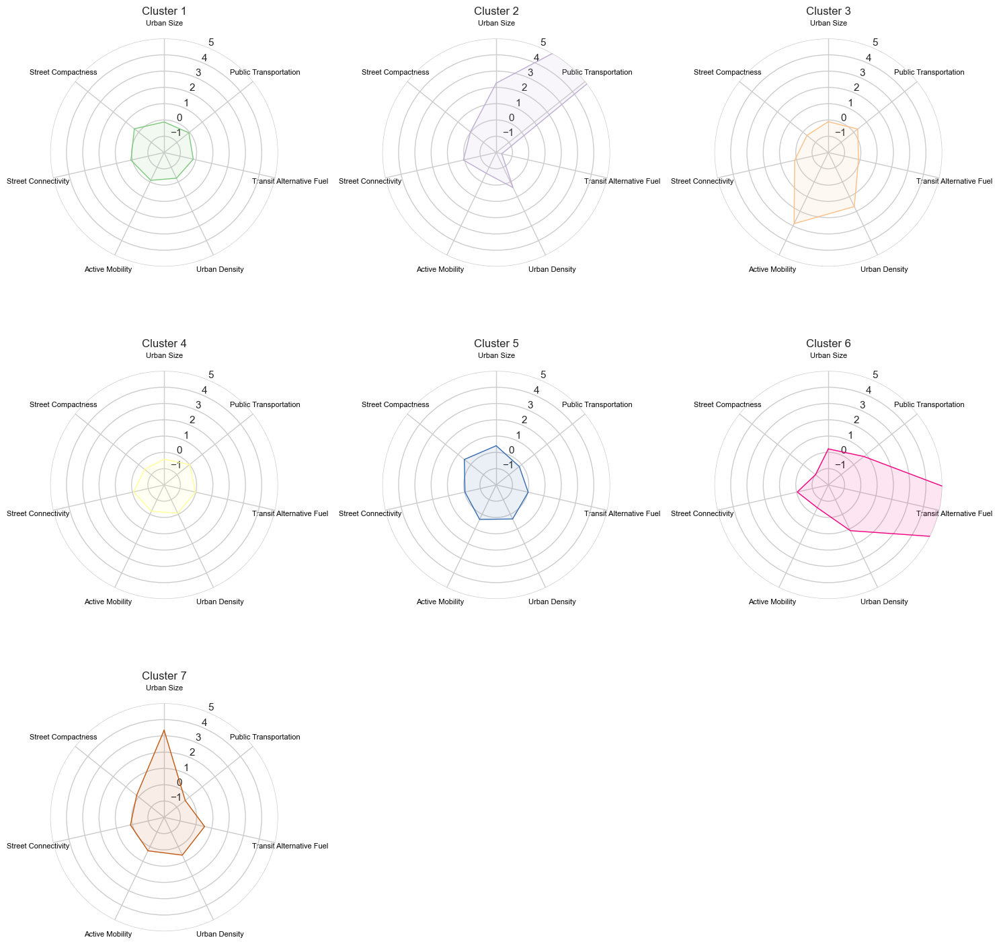

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

# Function to create radar charts
def create_radar_chart(df, cluster_label, ax, color):
    categories = list(df.columns)
    N = len(categories)
    
    # Get the values for the specific cluster
    values = df.loc[cluster_label].tolist()
    values += values[:1]  # Repeat the first value to close the circle
    
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=f'Cluster {cluster_label}', color=color)
    ax.fill(angles, values, alpha=0.1, color=color)
    
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), categories, fontsize=8, color='black')
    ax.spines['polar'].set_visible(False)
    ax.grid(True)
    ax.set_ylim(-2, 5)

    ax.set_title(f'Cluster {cluster_label}', fontsize=12)
    #ax.legend(loc='upper right')

# Number of clusters
num_clusters = len(cluster_means.index)

# Create figure and axes
cols = 3
rows = (num_clusters // cols) + (1 if num_clusters % cols != 0 else 0)
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows), subplot_kw=dict(polar=True))

# Flatten the axes array for easier indexing
axs = axs.flatten()

# Define colors for each cluster
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']

colors = custom_palette[:num_clusters]

# Create radar charts for each cluster
for i, cluster_label in enumerate(cluster_means.index):
    ax = axs[i]
    color = colors[i % len(colors)]  # Use index to access the colors list
    create_radar_chart(cluster_means, cluster_label, ax, color)
# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

# Adjust layout and display
plt.tight_layout()
plt.show()


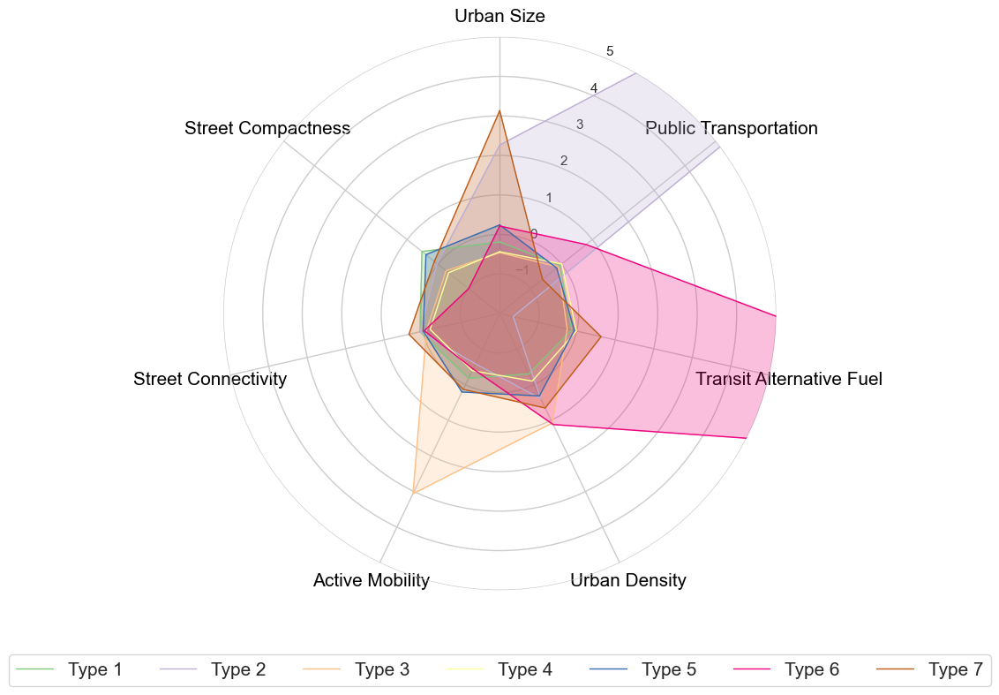

In [43]:
# Define your custom color palette
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']

# Function to create radar charts
def create_radar_chart(ax, df, cluster_label, color):
    categories = list(df.columns)
    N = len(categories)
    
    # Get the values for the specific cluster
    values = df.loc[cluster_label].tolist()
    values += values[:1]  # Repeat the first value to close the circle
    
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=f'Type {cluster_label}', color=color)
    ax.fill(angles, values, alpha=0.25, color=color)  # Adjust alpha for better visibility
    
    ax.set_theta_offset(pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), categories, fontsize=15, color='black')
    ax.spines['polar'].set_visible(False)
    ax.grid(True)
    ax.set_ylim(-2, 5)


# Number of clusters
num_clusters = len(cluster_medians.index)

# Create figure and a single set of polar axes
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

# Define colors for each cluster using the custom palette
colors = custom_palette[:num_clusters]  # Use only as many colors as clusters

# Create radar charts for each cluster on the same axes
for i, cluster_label in enumerate(cluster_medians.index):
    color = colors[i % len(colors)]  # Use index to access the colors list
    create_radar_chart(ax, cluster_medians, cluster_label, color)

# Add legend and adjust layout
# Create a legend below the plot
legend = ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=num_clusters, fontsize=15)
plt.tight_layout()
plt.savefig('../../figures/spider-plot.jpg', dpi=600)

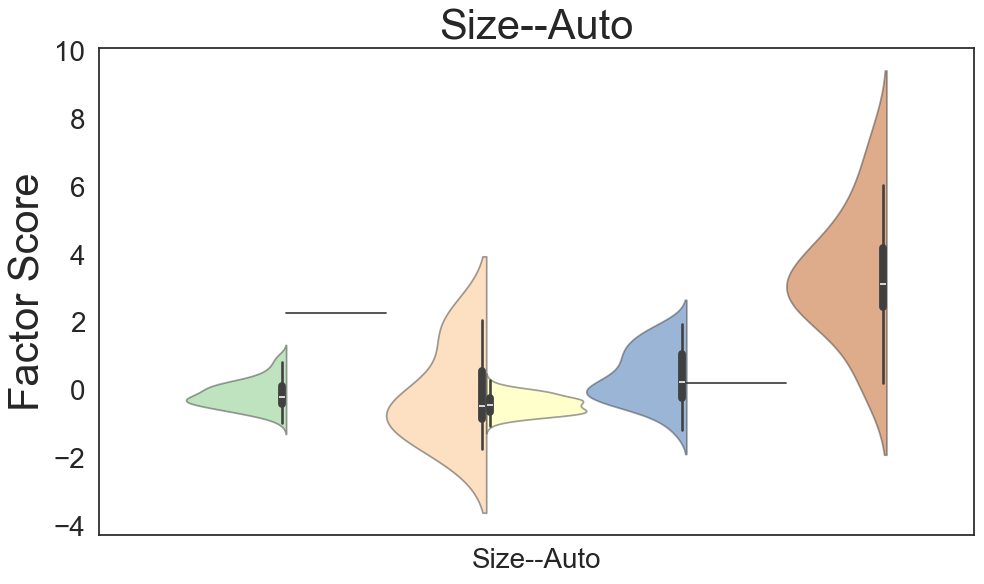

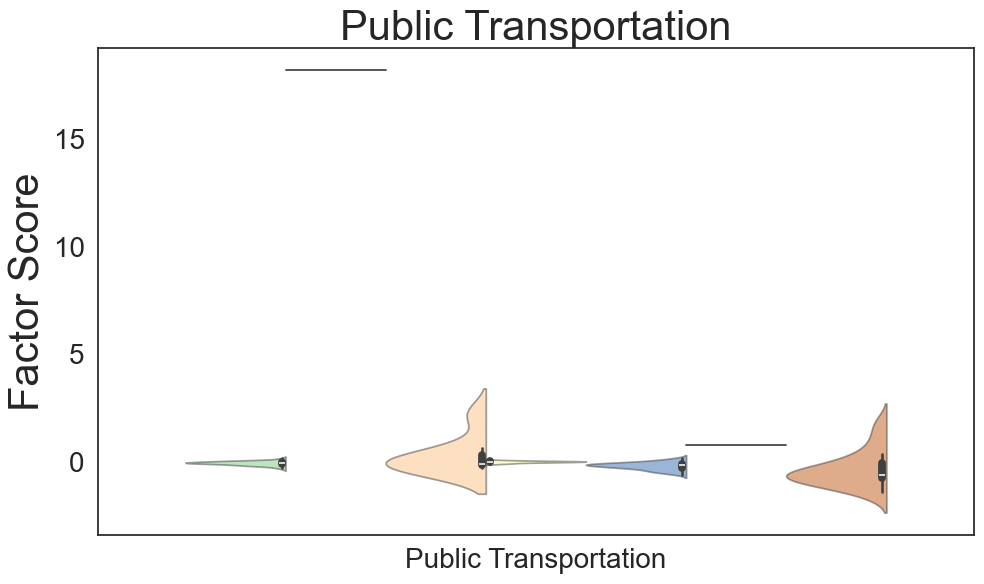

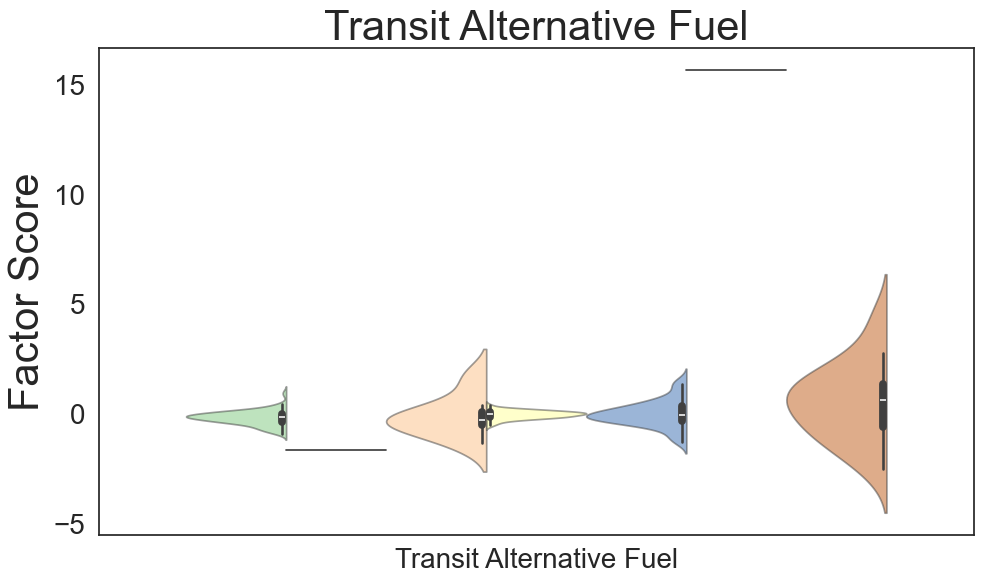

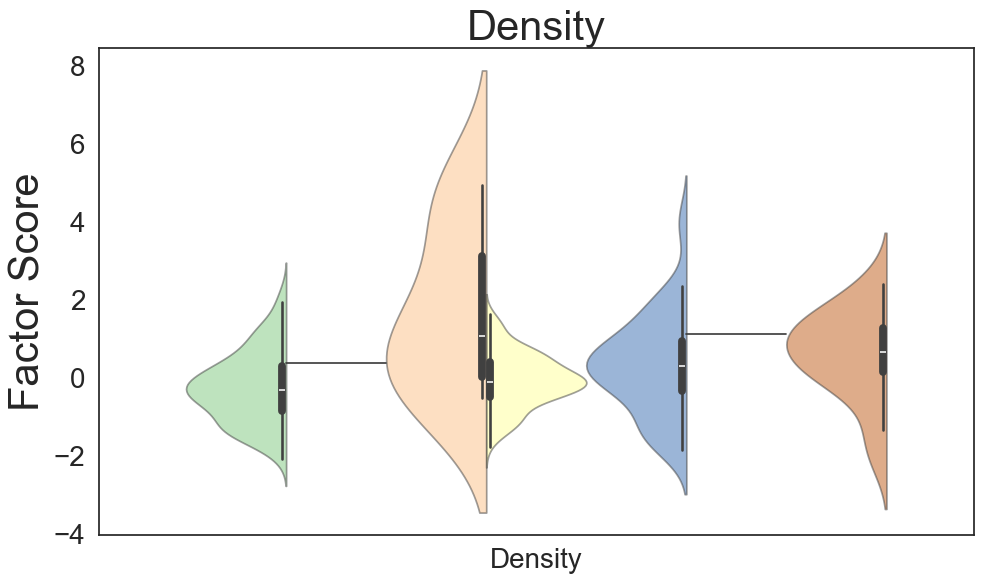

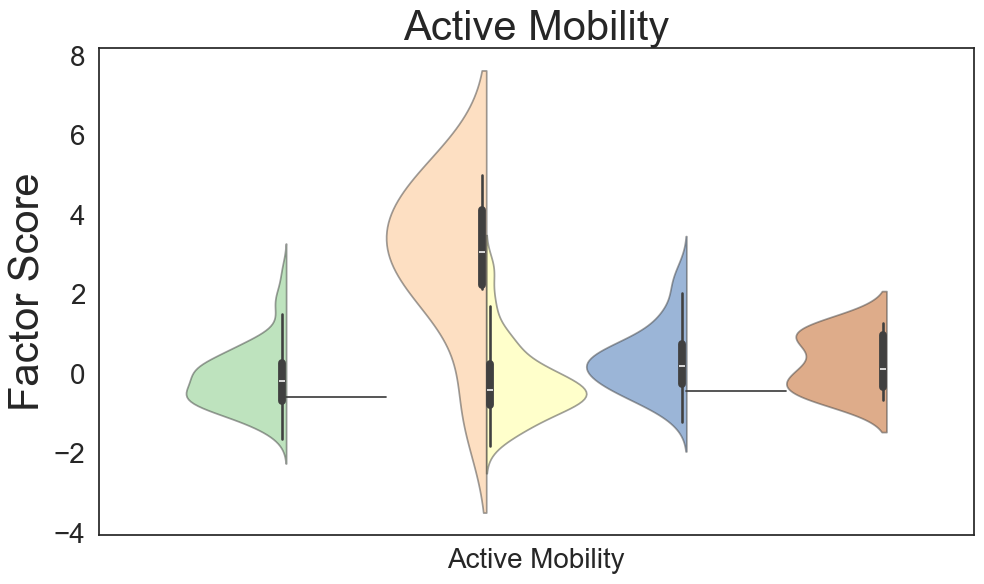

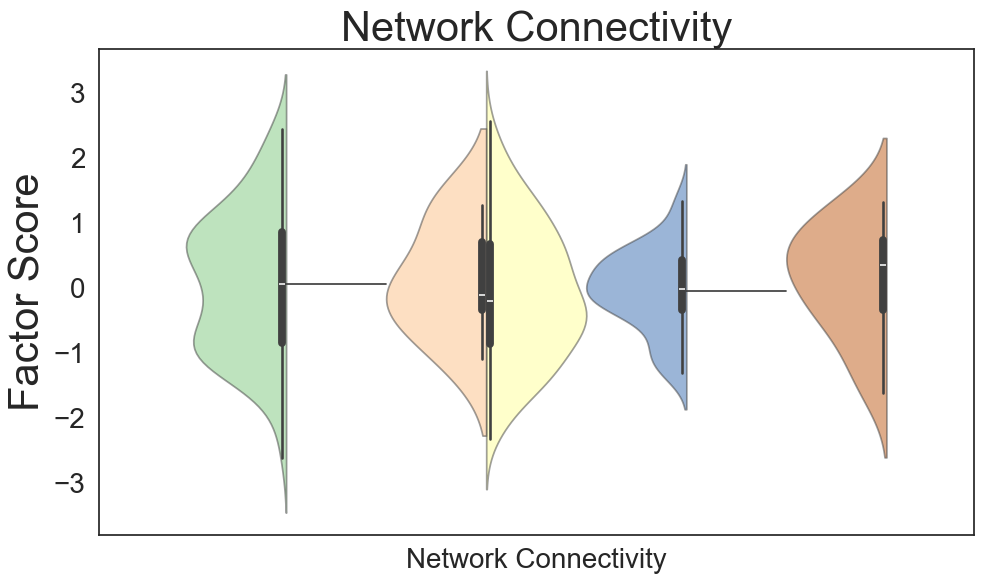

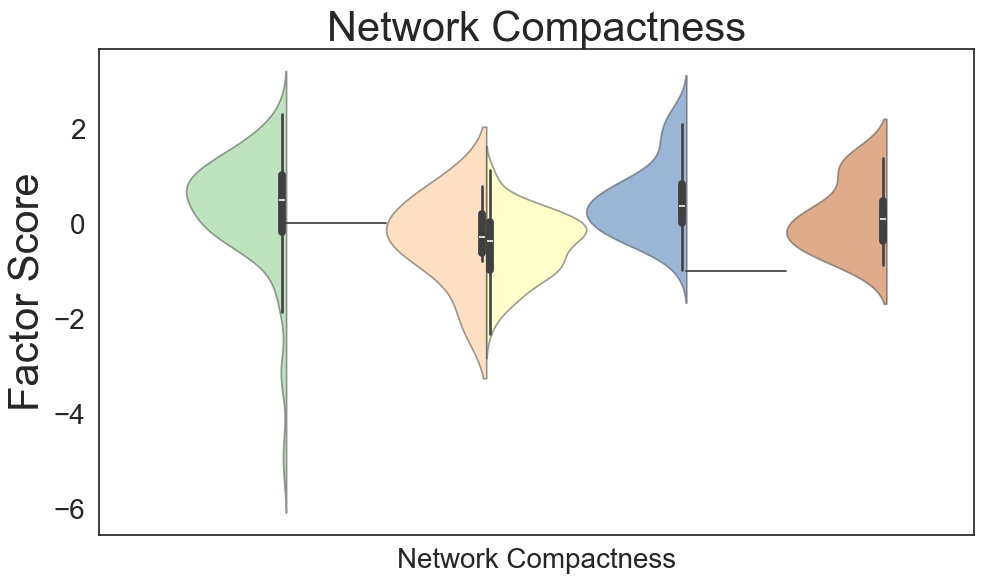

In [44]:
# Define colors for each cluster
custom_palette = ['#7fc97f', '#beaed4', '#fdc086', '#ffff99', '#386cb0', '#f0027f', '#bf5b17']

# Unique factors
unique_factors = pcdf_melt['factors'].unique()

# Directory to save plots
output_dir = '../../figures'
os.makedirs(output_dir, exist_ok=True)

# Create separate violin plots for each factor
for factor in unique_factors:
    # Create a new figure and axis for each factor
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Create the violin plot
    sns.violinplot(data=pcdf_melt[pcdf_melt['factors'] == factor], 
                   x='factors', 
                   hue='Cluster', 
                   y='Factor Score', 
                   palette=custom_palette, 
                   saturation=1, 
                   ax=ax, 
                   split=True)
    
    # Set alpha for violinplot collections
    plt.setp(ax.collections, alpha=.5)
    
    # Set labels and title with font sizes
    ax.set_xlabel('', fontsize=30)  # Set x-axis label font size
    ax.set_ylabel('Factor Score', fontsize=30)  # Set y-axis label font size
    ax.set_title(f'{factor}', fontsize=30)  # Set title font size
    
    # Increase the size of the ticks
    ax.tick_params(axis='both', which='major', labelsize=20)  # Major ticks
    ax.tick_params(axis='both', which='minor', labelsize=15)   # Minor ticks (if applicable)
    
    # Remove the legend
    ax.legend().set_visible(False)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the plot with the factor name in the file name
    plt.savefig(os.path.join(output_dir, f'{factor}-violinplot.jpg'), dpi=600)
    
    # Show the plot (optional, can be commented out if not needed)
    plt.show()